In [2]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.1.4 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.5 pynndescent==0.5.12


In [13]:
neuron = sc.read_h5ad('VTA_Neuron_clustering.h5ad')

In [14]:
neuron.X

<11906x22948 sparse matrix of type '<class 'numpy.float32'>'
	with 28469519 stored elements in Compressed Sparse Row format>

In [15]:
neuron

AnnData object with n_obs × n_vars = 11906 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1.50', 'le

In [16]:
neuron.obs

,n_genes,percent_mito,n_counts,doublet_score,predicted_doublet,Neuron,Sample,Neuron_merge,leiden_res_0.50,leiden_res_0.80,leiden_res_1.00,leiden_res_1.20,leiden_res_1.50
AAACCCAAGACTGTTC-1-VTA_1,2892,0.0,6381.0,0.093149,False,Neuron,VTA_1,Neuron,0,0,0,0,0
AAACCCAGTAACGCGA-1-VTA_1,4184,0.0,10386.0,0.089820,False,Neuron,VTA_1,Neuron,1,1,1,1,1
AAACCCAGTCACTAGT-1-VTA_1,3622,0.0,8986.0,0.032307,False,Neuron,VTA_1,Neuron,2,2,2,2,2
AAACGAAAGAGCATTA-1-VTA_1,1570,0.0,2479.0,0.013114,False,Neuron,VTA_1,Neuron,4,4,3,3,4
AAACGAAAGGTCACAG-1-VTA_1,2094,0.0,3892.0,0.030684,False,Neuron,VTA_1,Neuron,5,5,4,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTGTCACAT-1-VTA_2,1400,0.0,2185.0,0.028685,False,Neuron,VTA_2,Neuron,22,23,30,33,41
TTTGTTGGTTACCTGA-1-VTA_2,1561,0.0,2689.0,0.072700,False,Neuron,VTA_2,Neuron,3,3,16,17,21
TTTGTTGGTTCCCACT-1-VTA_2,2275,0.0,4429.0,0.039110,False,Neuron,VTA_2,Neuron,14,18,19,21,25
TTTGTTGTCACGAACT-1-VTA_2,4517,0.0,13127.0,0.111898,False,Neuron,VTA_2,Neuron,6,6,5,5,7


In [17]:
Class = []
for i in range(neuron.shape[0]):
    if (int(neuron.obs['leiden_res_0.80'][i]) in (18,11,1,30,23,27,29,24,26,28)): 
        Class.append('Glut')
    elif (int(neuron.obs['leiden_res_0.80'][i]) in (22,9,19,20,14,10,13,16,21)): 
        Class.append('GABA')
    elif (int(neuron.obs['leiden_res_0.80'][i]) in (5,17,0,25,2,7,6,3,8)): 
        Class.append('GABA-Glut')
    elif (int(neuron.obs['leiden_res_0.80'][i]) == 15): 
        Class.append('Glut-Sero')
    elif (int(neuron.obs['leiden_res_0.80'][i]) == 4): 
        Class.append('Dopa')
    else: 
        Class.append('Non-neuron')
neuron.obs['Class'] = Class

/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_82668/1879895297.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if (int(neuron.obs['leiden_res_0.80'][i]) in (18,11,1,30,23,27,29,24,26,28)):
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_82668/1879895297.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif (int(neuron.obs['leiden_res_0.80'][i]) in (22,9,19,20,14,10,13,16,21)):
/var/folders/r4/hfj1yx3s3bd93mtgxzfwcfyc0000gn/T/ipykernel_82668/1879895297.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treate

In [19]:
neuron.write('VTA_neuron_update.h5ad')

In [20]:
adata  = neuron[neuron.obs['Class']== 'GABA-Glut',:]

In [21]:
adata

View of AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Neuron', 'Sample', 'Neuron_merge', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leide

In [22]:
del adata.obs['Neuron']
del adata.obs['Neuron_merge']
del adata.obs['leiden_res_0.50']
del adata.obs['leiden_res_0.80']
del adata.obs['leiden_res_1.00']
del adata.obs['leiden_res_1.20']
del adata.obs['leiden_res_1.50']

In [23]:
adata

View of AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1.50', 'leiden_res_1.50_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs

In [24]:
del adata.uns['Neuron_colors']
del adata.uns['Neuron_merge_colors']
del adata.uns['Sample_colors']


In [26]:
adata

AnnData object with n_obs × n_vars = 6169 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'leiden_res_1.50', 'leiden_res_1.50_colo

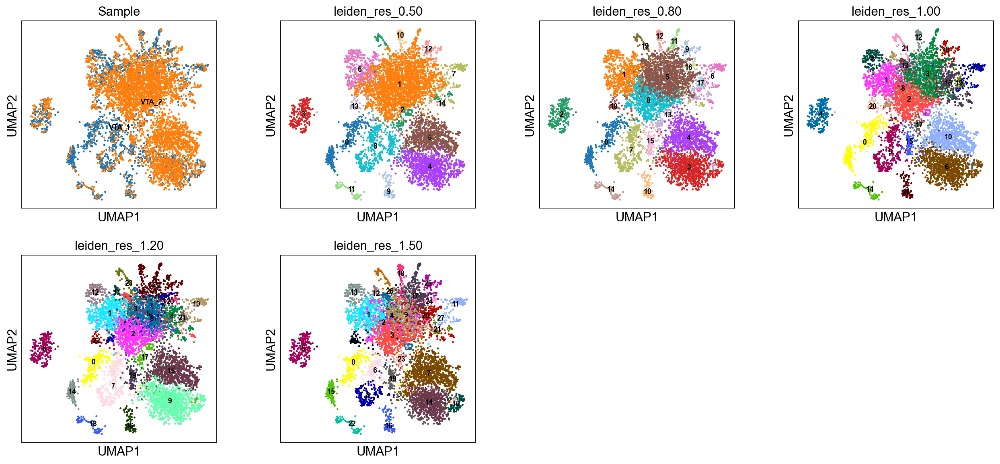

In [27]:
sc.pl.umap(
    adata,
    color=["Sample","leiden_res_0.50", "leiden_res_0.80","leiden_res_1.00","leiden_res_1.20","leiden_res_1.50"],
    legend_loc="on data",legend_fontsize=8
)

computing PCA
    with n_comps=50


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:05)
[0.02554505 0.01631253 0.00857668 0.00400894 0.003454   0.00302676
 0.00255984 0.00196667 0.00182269 0.0016135  0.00150281 0.00136493
 0.00129713 0.00125083 0.00121662 0.00108511 0.00103791 0.00096832
 0.00095315 0.00092313 0.00091169 0.00088136 0.0008714  0.00085359
 0.00084937 0.00083782 0.00081995 0.00081337 0.00079542 0.000781
 0.00077665 0.0007736  0.00076966 0.0007584  0.00074202 0.00073749
 0.00073093 0.00072312 0.0007194  0.00071543 0.00070604 0.0007008
 0.00069588 0.00069468 0.00069102 0.00068712 0.00068228 0.00067801
 0.00067225 0.00066905]


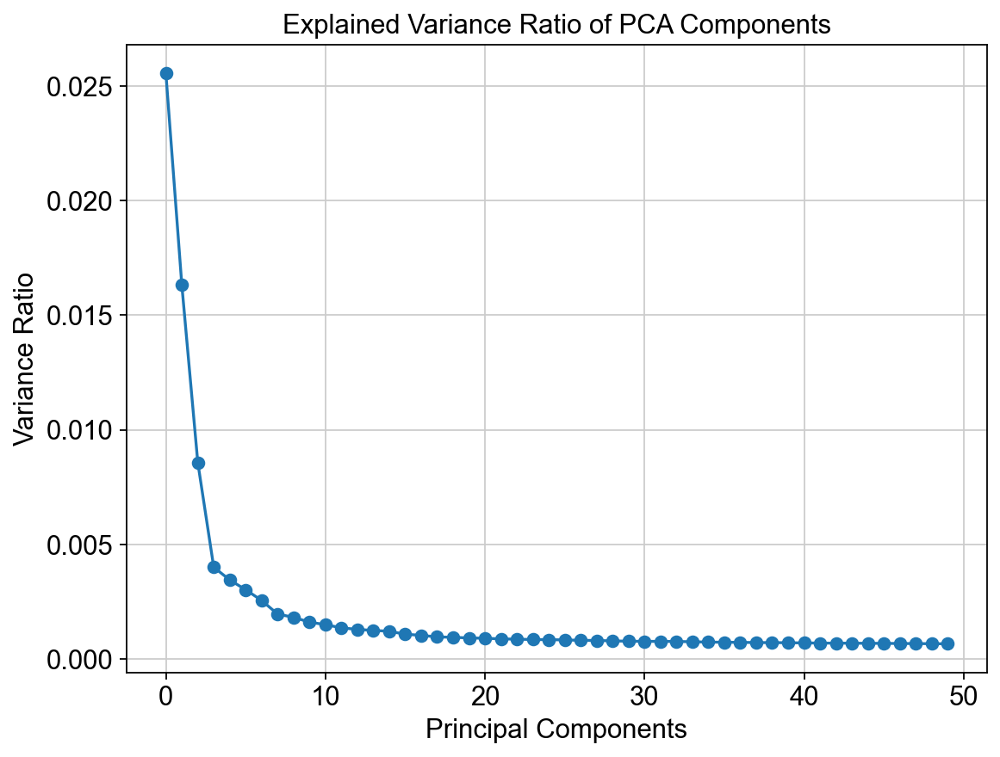

In [28]:
adata.obsm['X_pca'] = adata.obsm['X_harmony']
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=False)
explained_variance_ratio = adata.uns['pca']['variance_ratio']
print(explained_variance_ratio)

# 可视化解释方差比
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(range(len(explained_variance_ratio)), explained_variance_ratio, 'o-')
plt.title('Explained Variance Ratio of PCA Components')
plt.xlabel('Principal Components')
plt.ylabel('Variance Ratio')
plt.show()

In [30]:
for res in [0.2,0.3,0.4]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:00)


In [31]:
for res in [0.1,0.15]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.10', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.15', the cluster labels (adata.obs, categorical) (0:00:00)


In [32]:
for res in [0.05,0.07]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.07', the cluster labels (adata.obs, categorical) (0:00:00)


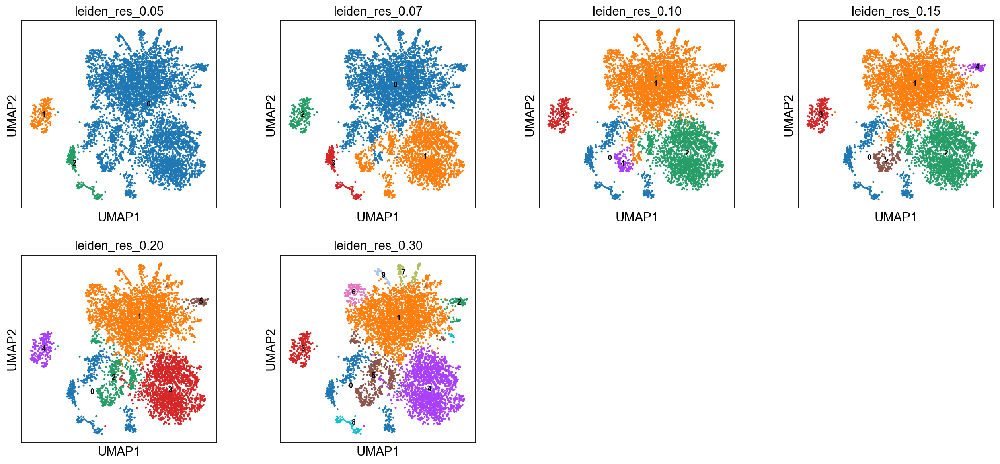

In [33]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.05", "leiden_res_0.07","leiden_res_0.10","leiden_res_0.15","leiden_res_0.20","leiden_res_0.30"],
    legend_loc="on data",legend_fontsize=8
)

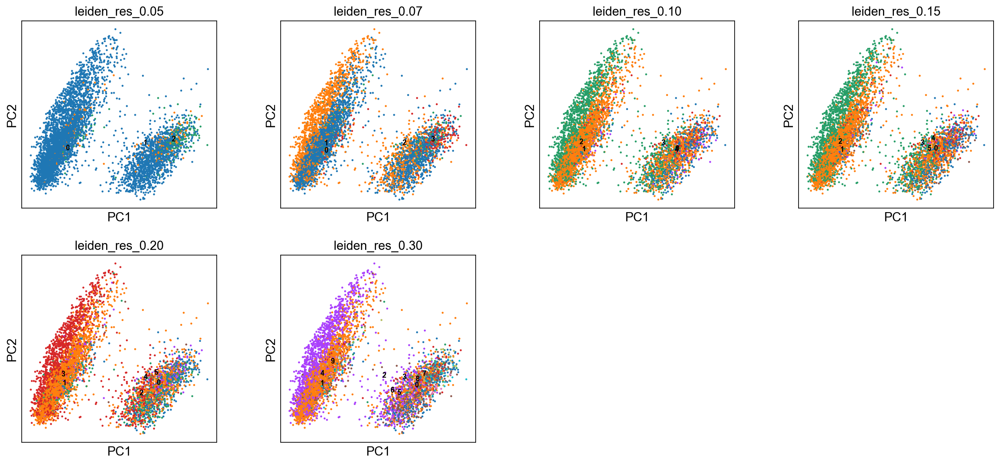

In [34]:
sc.pl.pca(
    adata,
    color=["leiden_res_0.05", "leiden_res_0.07","leiden_res_0.10","leiden_res_0.15","leiden_res_0.20","leiden_res_0.30"],
    legend_loc="on data",legend_fontsize=8
)

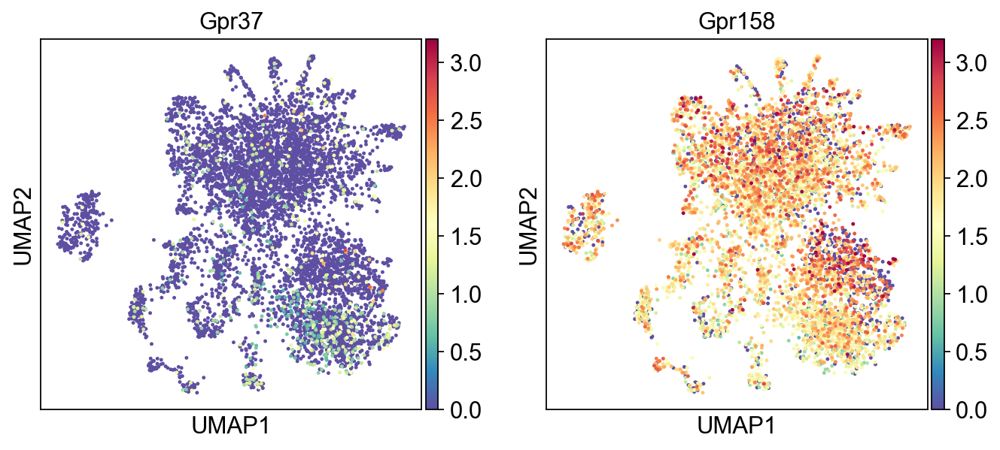

In [35]:
sc.pl.umap(
    adata,
    color=["Gpr37", "Gpr158"],
    legend_fontsize=8,vmax = 3.2,cmap='Spectral_r'
)

In [36]:
marker_gene = ['Slc17a6','Slc17a7','Slc17a8','Snap25','Slc32a1','Slc18a2','Gad1','Gad2','Aldh1a1','Th','Ddc','Slc6a3','Slc6a4','Tph2']

In [37]:
sc.tl.dendrogram(adata, groupby='leiden_res_0.07',use_rep='X_harmony')

Storing dendrogram info using `.uns['dendrogram_leiden_res_0.07']`


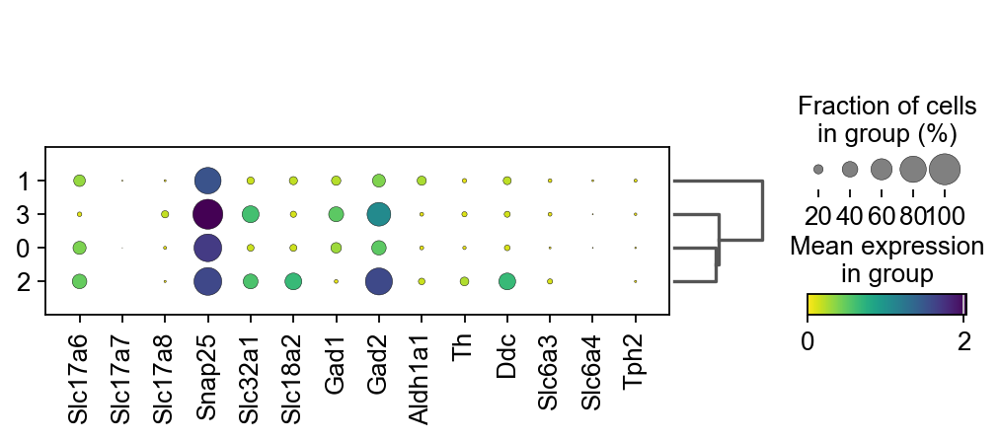

In [38]:
sc.pl.dotplot(adata, marker_gene,groupby=["leiden_res_0.07"],cmap='viridis_r',dendrogram=True)

In [41]:
gaba_glut_new = adata[adata.obs['leiden_res_0.07'].isin (['1','0']),:]

In [43]:
gaba_glut_new.write('VTA_GABA_Glut.h5ad')

In [44]:
adata = gaba_glut_new

In [3]:
adata=sc.read_h5ad('VTA_GABA_Glut.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 5736 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.40', 'leiden_res_0.10', 'leiden_res_0.15', 'leiden_res_0.05', 'leiden_res_0.07'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.07', 'dendrogram_leiden_res_0.10', 'dendrogram_leiden_res_0.15', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:664: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    with n_comps=50
    finished (0:00:00)


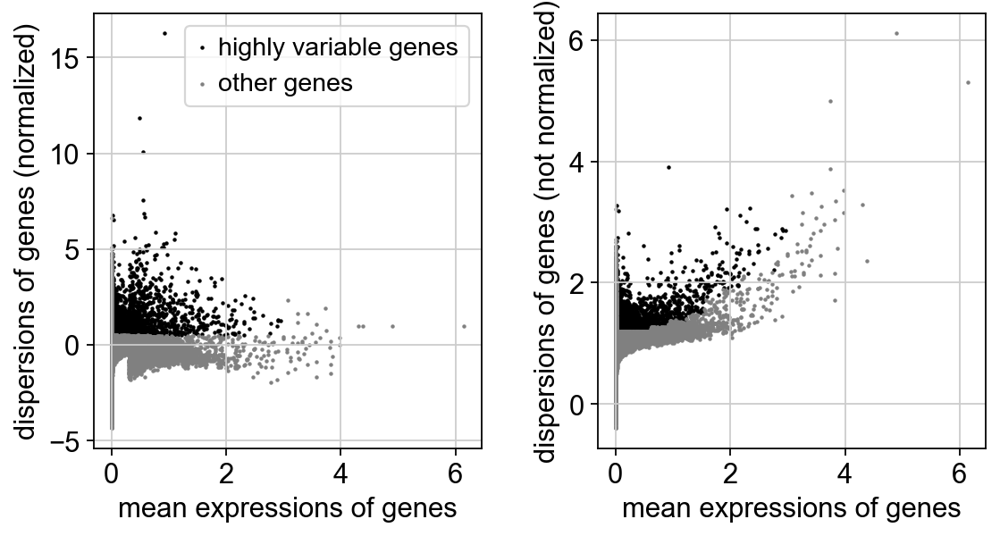

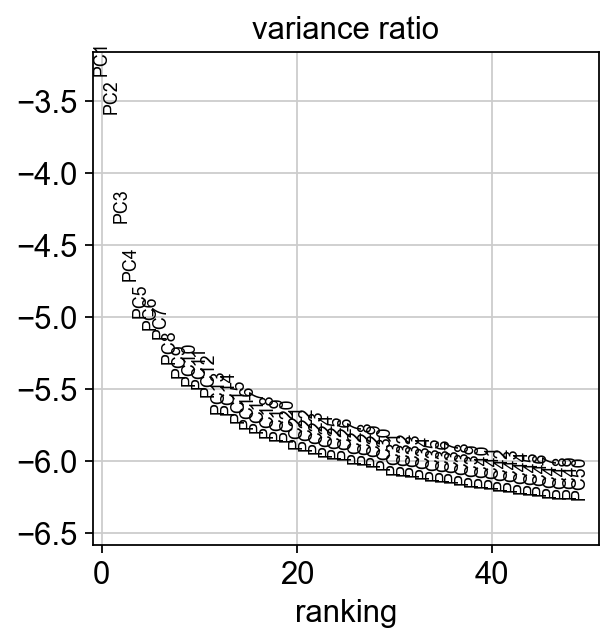

2024-05-24 14:47:47,083 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-24 14:47:47,676 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-24 14:47:47,695 - harmonypy - INFO - Iteration 1 of 10
2024-05-24 14:47:48,130 - harmonypy - INFO - Iteration 2 of 10
2024-05-24 14:47:48,577 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


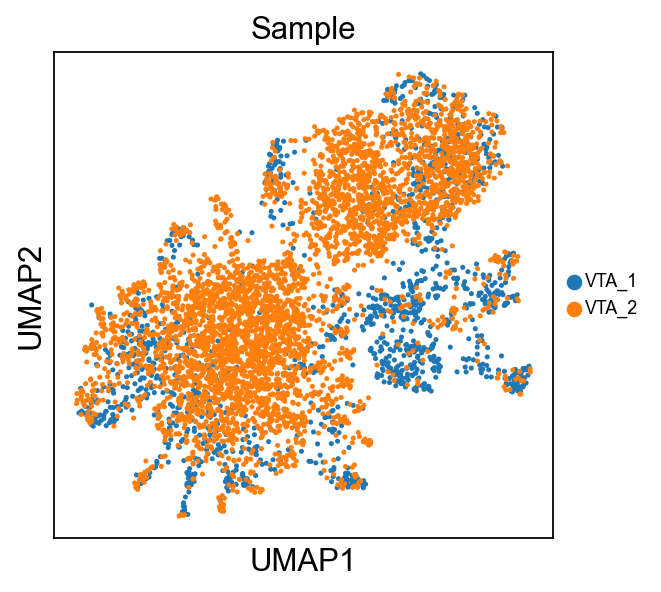

In [46]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat')
sc.set_figure_params(color_map='RdBu_r')
sc.tl.pca(adata, svd_solver='arpack',use_highly_variable=True)
sc.pl.highly_variable_genes(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)
sc.external.pp.harmony_integrate(adata, 'Sample', basis='X_pca', adjusted_basis='X_harmony')
sc.pp.neighbors(adata, n_neighbors=20, use_rep='X_harmony')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="Sample",
    legend_fontsize=8
)

computing PCA
    with n_comps=50


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:04)
[0.02306183 0.01717425 0.00917653 0.0036718  0.00345925 0.00248028
 0.00205265 0.00196381 0.00165967 0.00156117 0.00144403 0.00138335
 0.00128293 0.00116261 0.00110834 0.00101783 0.00100707 0.00098304
 0.00095294 0.00094054 0.00091748 0.00089922 0.0008925  0.00086349
 0.00084376 0.00084087 0.00082629 0.00082256 0.00081571 0.00080494
 0.00079299 0.00079002 0.00077777 0.00077279 0.0007654  0.00075747
 0.00075511 0.00075066 0.00074371 0.00073557 0.00073456 0.00072807
 0.00072147 0.0007161  0.00071137 0.00070874 0.00070627 0.00070212
 0.00069455 0.00069012]


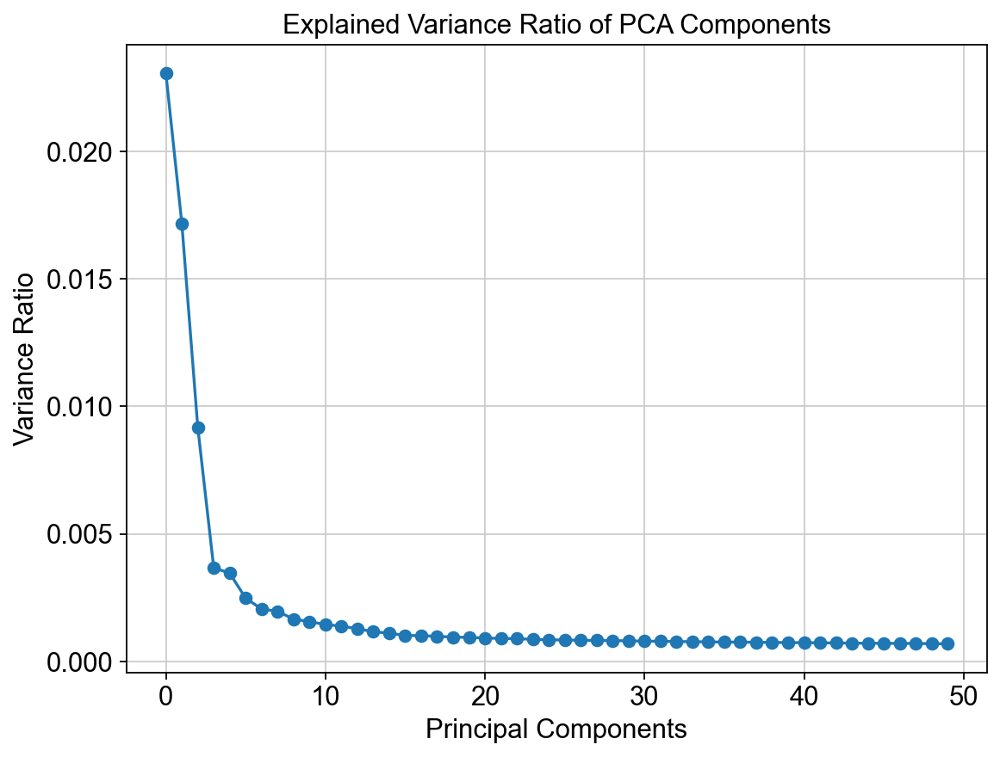

In [47]:
adata.obsm['X_pca'] = adata.obsm['X_harmony']
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=False)
explained_variance_ratio = adata.uns['pca']['variance_ratio']
print(explained_variance_ratio)

# 可视化解释方差比
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(range(len(explained_variance_ratio)), explained_variance_ratio, 'o-')
plt.title('Explained Variance Ratio of PCA Components')
plt.xlabel('Principal Components')
plt.ylabel('Variance Ratio')
plt.show()

In [48]:
for res in [0.2,0.3,0.4]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:00)


In [50]:
for res in [0.05,0.1,0.15]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

running Leiden clustering
    finished: found 1 clusters and added
    'leiden_res_0.05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.10', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.15', the cluster labels (adata.obs, categorical) (0:00:00)


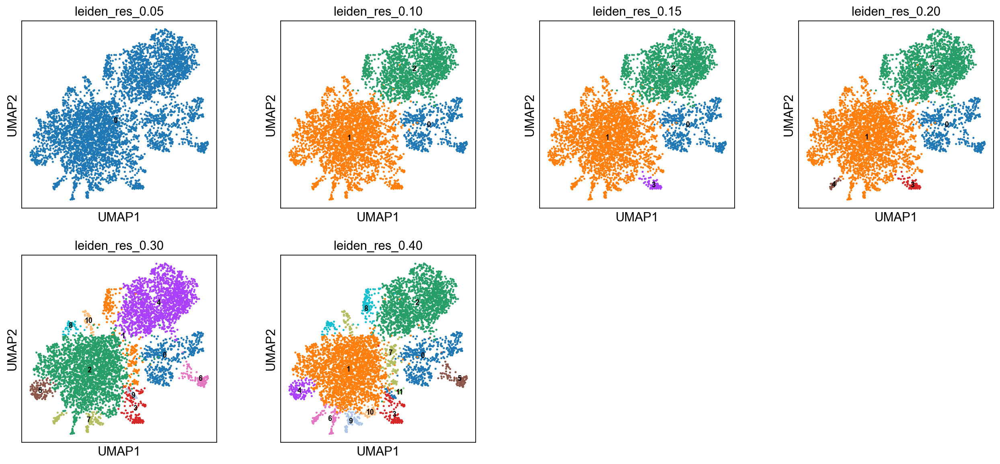

In [51]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.05", "leiden_res_0.10","leiden_res_0.15","leiden_res_0.20","leiden_res_0.30","leiden_res_0.40"],
    legend_loc="on data",legend_fontsize=8
)

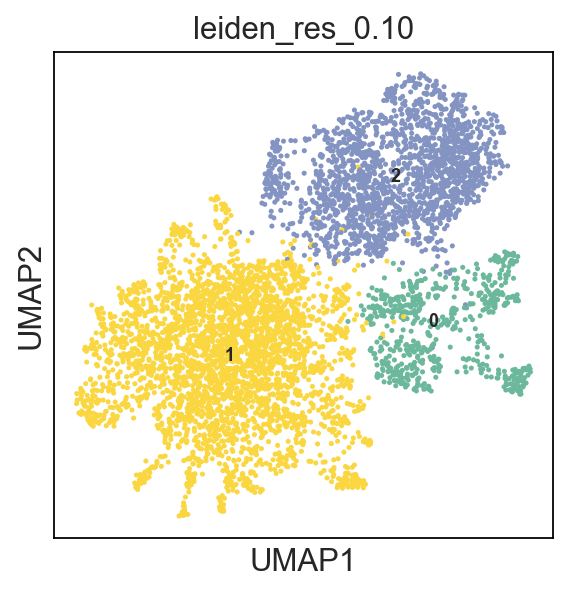

In [183]:
sc.pl.umap(
    adata,
    color= "leiden_res_0.10",
    legend_loc="on data",legend_fontsize=8,palette=['#6cb89c','#fad741','#8494c2'],save='GABA-Glut-clustering.pdf'
)

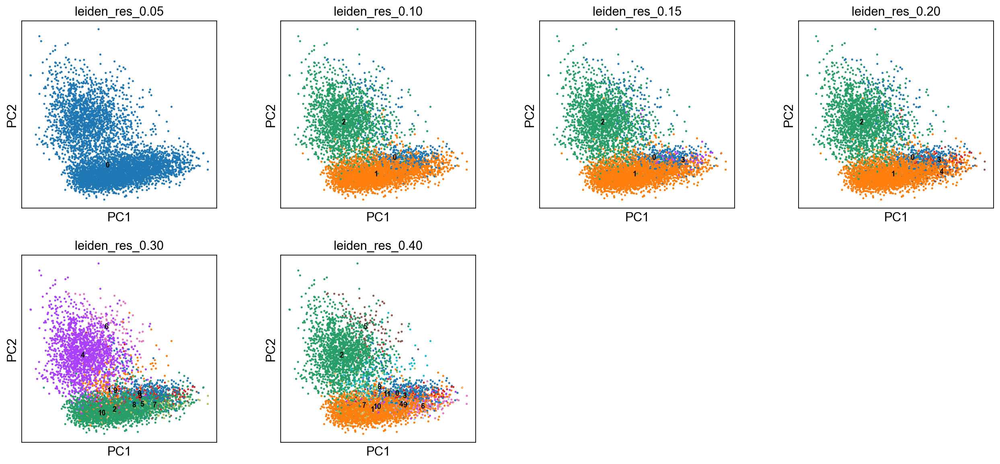

In [54]:
sc.pl.pca(
    adata,
    color=["leiden_res_0.05", "leiden_res_0.10","leiden_res_0.15","leiden_res_0.20","leiden_res_0.30","leiden_res_0.40"],
    legend_loc="on data",legend_fontsize=8
)

In [53]:
adata.obsm['X_pca'] = adata.obsm['X_harmony']

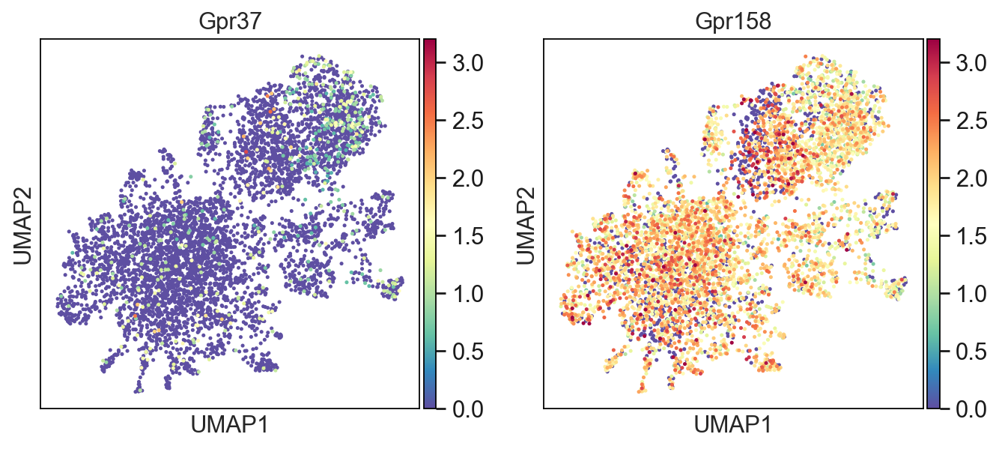

In [179]:
sc.pl.umap(
    adata,
    color=["Gpr37", "Gpr158"],
    legend_fontsize=8,vmax = 3.2,cmap='Spectral_r',save = 'Gpr37_158_gaba-glut.pdf'
)

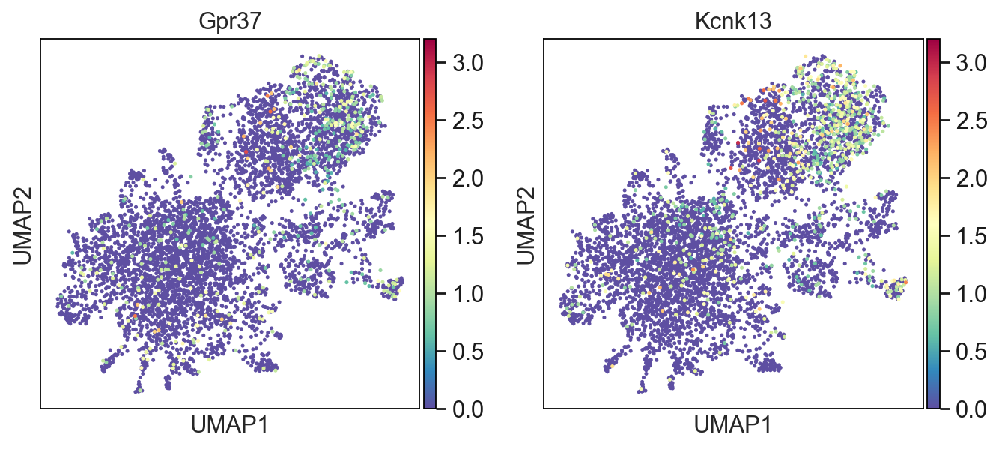

In [188]:
sc.pl.umap(
    adata,
    color=["Gpr37", "Kcnk13"],
    legend_fontsize=8,vmax = 3.2,cmap='Spectral_r',save = 'Gpr37_Kcnk13_gaba-glut.pdf'
)

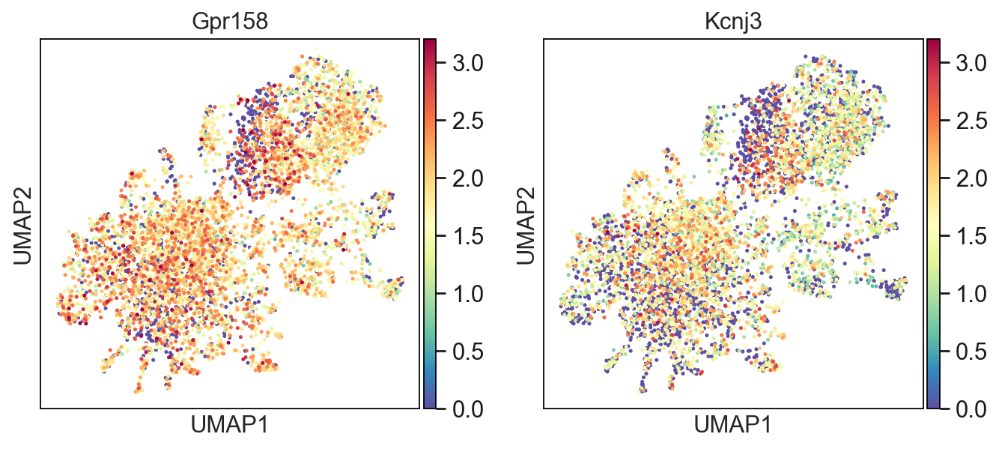

In [189]:
sc.pl.umap(
    adata,
    color=["Gpr158", "Kcnj3"],
    legend_fontsize=8,vmax = 3.2,cmap='Spectral_r',save = 'Gpr158_Kcnj3_gaba-glut.pdf'
)

In [ ]:
K_channel_genes=['Kcnma1','Kcnn1','Kcnn2','Kcnn3','Kcnn4','Kcnt1','Kcnt2','Kcunu1','Kcnj1','Kcnj2','Kcnj12','Kcnj4','Kcnj14','Kcnj3','Kcnj6','Kcnj9','Kcnj5','Kcnj10','Kcnj15','Kcnj16','Kcnj8','Kcnj11','Kcnj13','Kcnk1','Kcnk2','Kcnk3','Kcnk4','Kcnk5','Kcnk6','Kcnk7','Kcnk8','Kcnk9','Kcnk10','Kcnk11','Kcnk12','Kcnk13','Kcnk14','Kcnk15','Kcnk16','Kcnk18','Kcna1','Kcna2','Kcna3','Kcna4','Kcna5','Kcna6','Kcna7','Kcna10','Kcnb1','Kcnb2','Kcnc1','Kcnc2','Kcnc3','Kcnc4','Kcnd1','Kcnd2','Kcnd3','Kcn1','Kcng1','Kcng2','Kcng3','Kcng4','Kcnq1','Kcnq2','Kcnq3','Kcnq4','Kcnq5','Kcnv1','Kcnv2','Kcns1','Kcns2','Kcns3','Kcnh1','Kcnh2','Kcnh3','Kcnh4','Kcnh5','Kcnh6','Kcnh7','Kcnh8']


In [57]:
for res in [0.1,0.15]:
    sc.tl.dendrogram(adata, groupby=f"leiden_res_{res:4.2f}",use_rep='X_harmony')

Storing dendrogram info using `.uns['dendrogram_leiden_res_0.10']`
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.15']`


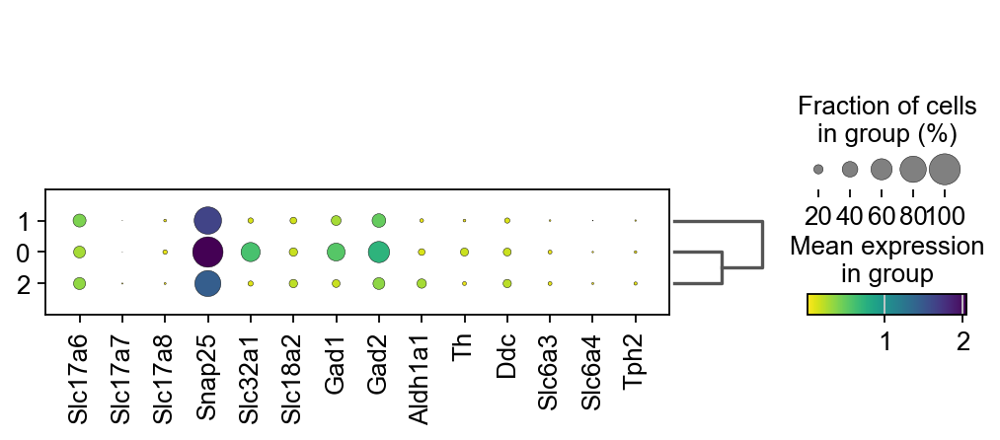

In [58]:
sc.pl.dotplot(adata, marker_gene,groupby=["leiden_res_0.10"],cmap='viridis_r',dendrogram=True)

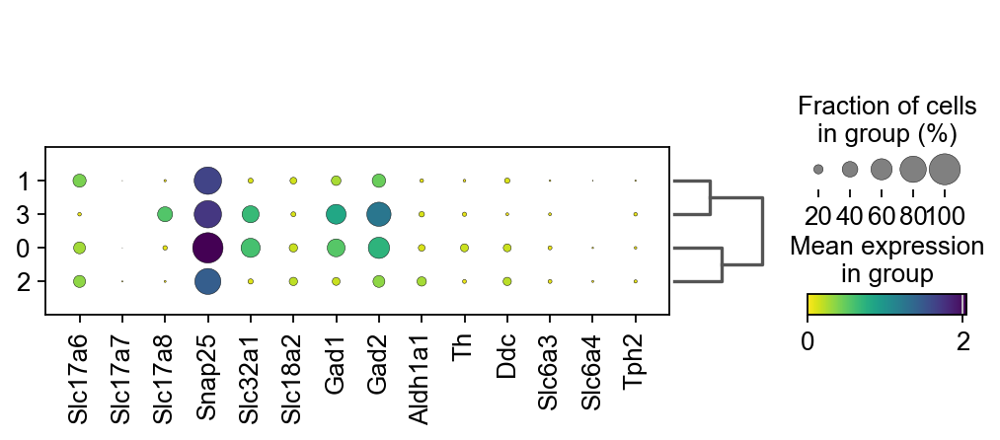

In [59]:
sc.pl.dotplot(adata, marker_gene,groupby=["leiden_res_0.15"],cmap='viridis_r',dendrogram=True)

In [60]:
gene = ["Gpr37","Gpr158","Kcnk13","Kcna1","Kcna2","Kcnj3","Kcnh2","Kcnd2","Kcnd3"]

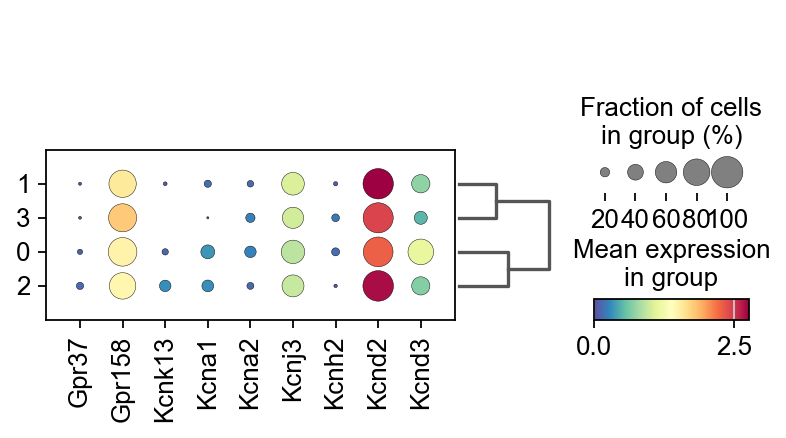

In [62]:
sc.pl.dotplot(adata, gene,groupby=["leiden_res_0.15"],cmap='Spectral_r',use_raw=False,dendrogram=True)

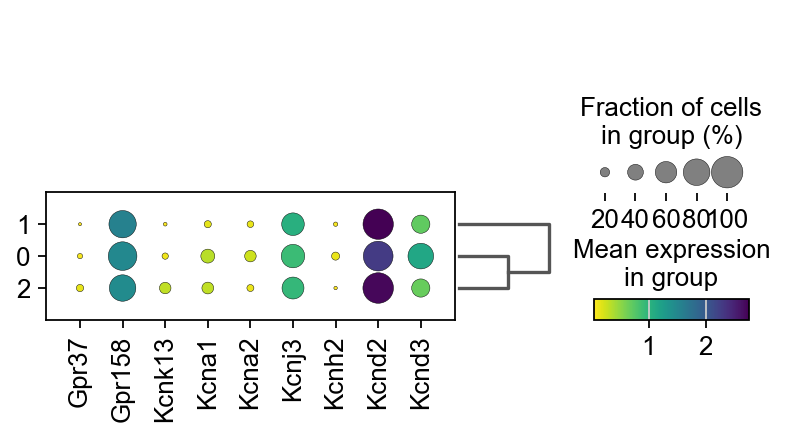

In [67]:
sc.pl.dotplot(adata, gene,groupby=["leiden_res_0.10"],cmap='viridis_r',use_raw=False,dendrogram=True)

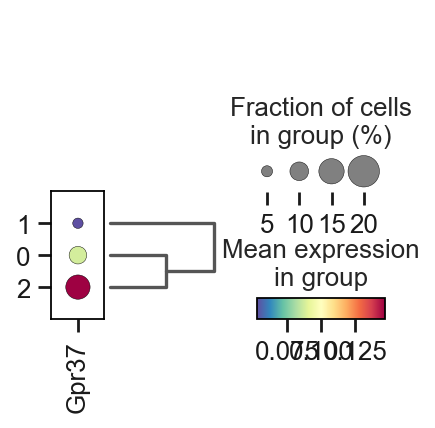

In [184]:
sc.pl.dotplot(adata, 'Gpr37',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True,save='Gpr37-gaba-glut.pdf')

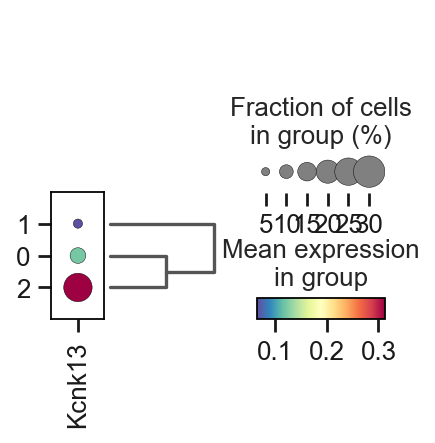

In [190]:
sc.pl.dotplot(adata, 'Kcnk13',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True,save='Kcnk13-gaba-glut.pdf')

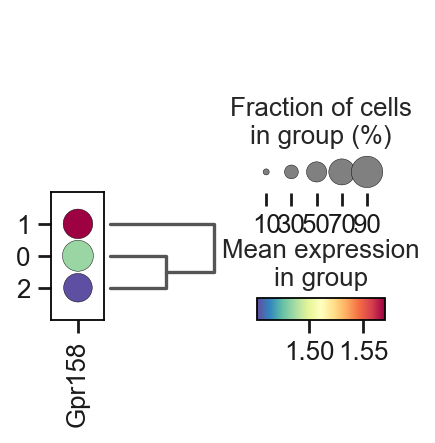

In [185]:
sc.pl.dotplot(adata, 'Gpr158',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True,save='Gpr158-gaba-glut.pdf')

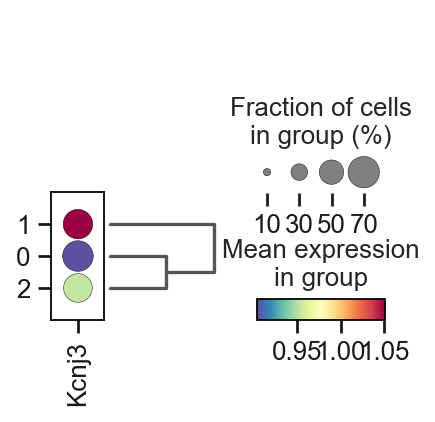

In [191]:
sc.pl.dotplot(adata, 'Kcnj3',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True,save='Kcnj3-gaba-glut.pdf')


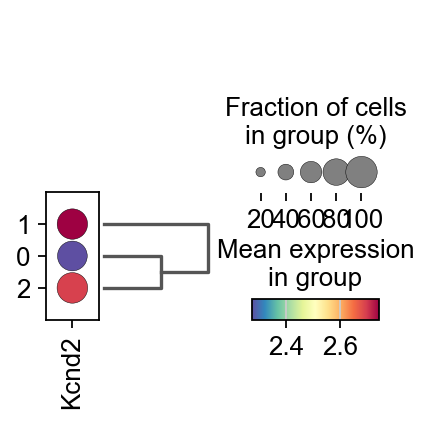

In [77]:
sc.pl.dotplot(adata, 'Kcnd2',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True)

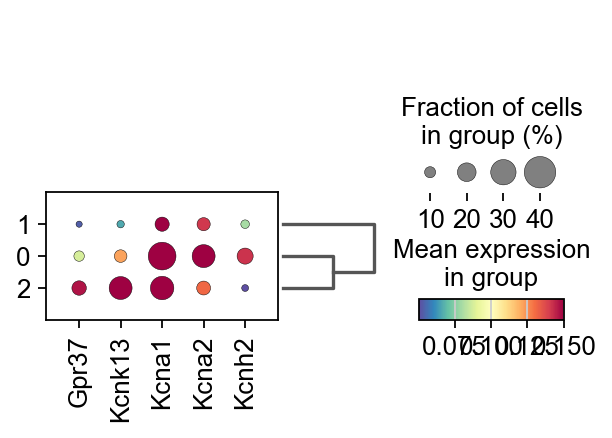

In [75]:
sc.pl.dotplot(adata, ['Gpr37','Kcnk13','Kcna1','Kcna2','Kcnh2'],groupby=["leiden_res_0.10"],cmap='Spectral_r',vmax=0.15,use_raw=False,dendrogram=True)

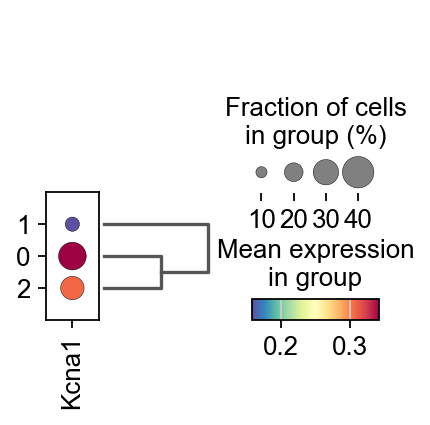

In [79]:
sc.pl.dotplot(adata,'Kcna1',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True)

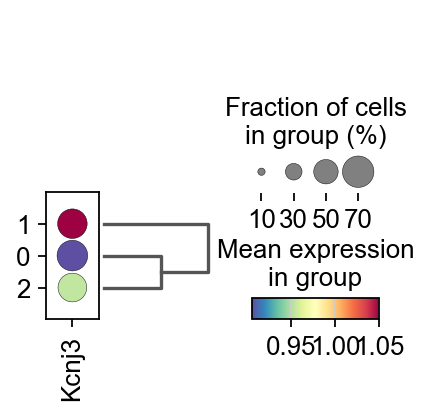

In [70]:
sc.pl.dotplot(adata, 'Kcnj3',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True)

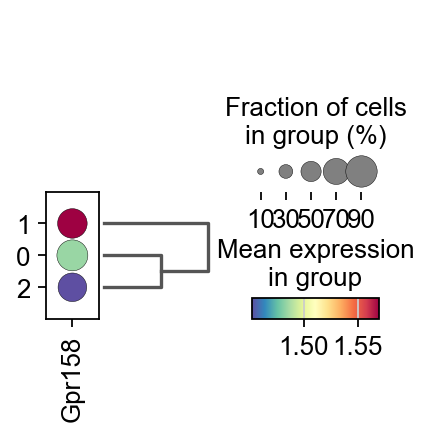

In [69]:
sc.pl.dotplot(adata, 'Gpr158',groupby=["leiden_res_0.10"],cmap='Spectral_r',use_raw=False,dendrogram=True)

ranking genes
    finished: added to `.uns['wilcoxon_tie_0.1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:16)


/opt/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:352: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:352: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/anaconda3/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:352: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (


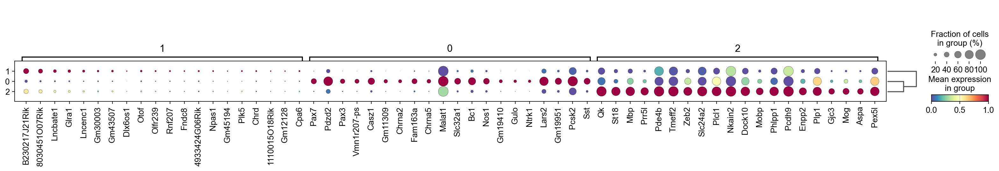

In [80]:
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.10',groups='all', reference='rest',tie_correct=True, method='wilcoxon',key_added='wilcoxon_tie_0.1')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=20,groupby='leiden_res_0.10',cmap='Spectral_r', standard_scale='var',key='wilcoxon_tie_0.1',min_logfoldchange=1)

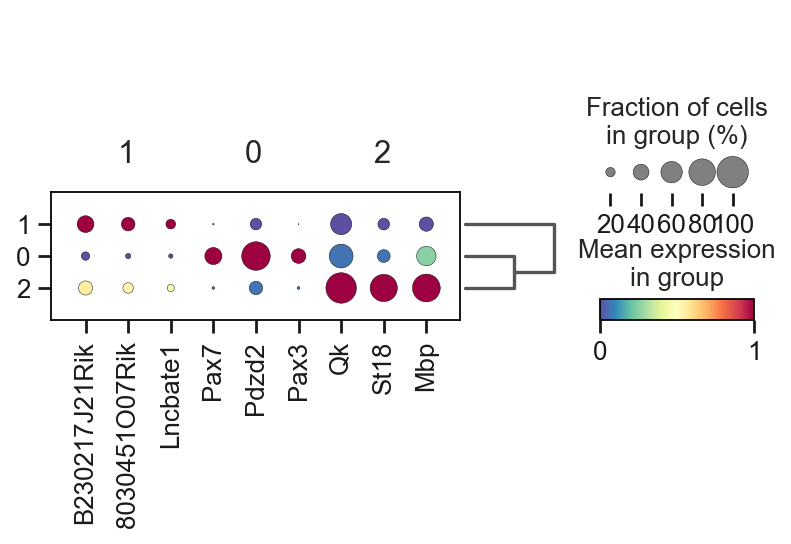

In [187]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3,groupby='leiden_res_0.10',cmap='Spectral_r', standard_scale='var',key='wilcoxon_tie_0.1',min_logfoldchange=1,save='gaba-glut-markergene.pdf')

In [81]:
df_0=sc.get.rank_genes_groups_df(adata, group='0',key='wilcoxon_tie_0.1', pval_cutoff=0.001, log2fc_min=1)
df_1=sc.get.rank_genes_groups_df(adata, group='1',key='wilcoxon_tie_0.1', pval_cutoff=0.001, log2fc_min=1)
df_2=sc.get.rank_genes_groups_df(adata, group='2',key='wilcoxon_tie_0.1', pval_cutoff=0.001, log2fc_min=1)

In [82]:
df_0.to_csv('gaba-glut_cluster0_markergene.xls',index=True,sep = '\t')
df_1.to_csv('gaba-glut_cluster1_markergene.xls',index=True,sep = '\t')
df_2.to_csv('gaba-glut_cluster2_markergene.xls',index=True,sep = '\t')

In [96]:
c0_gene=['Gpr37','Gpr158','Pax7','Pdzd2','Pax3','Vmn1r207-ps','Casz1','Gm11309','Chrna2','Fam163a','Chrna5','Slc32a1','Bc1','Nos1','Gm19410','Gulo','Ntrk1','Lars2']
c1_gene=['Gpr37','Gpr158','B230217J21Rik','8030451O07Rik','Lncbate1','Glra1','Lncenc1','Gm30003','Gm43507','Dlx6os1','Otof','Olfr239','Rnf207','Fndc8','4933424G06Rik','Npas1']
c2_gene=['Gpr37','Gpr158','Qk','St18','Mbp','Prr5l','Pde4b','Tmeff2','Zeb2','Slc24a2','Plcl1','Nkain2','Dock10','Mobp','Phlpp1','Pcdh9']

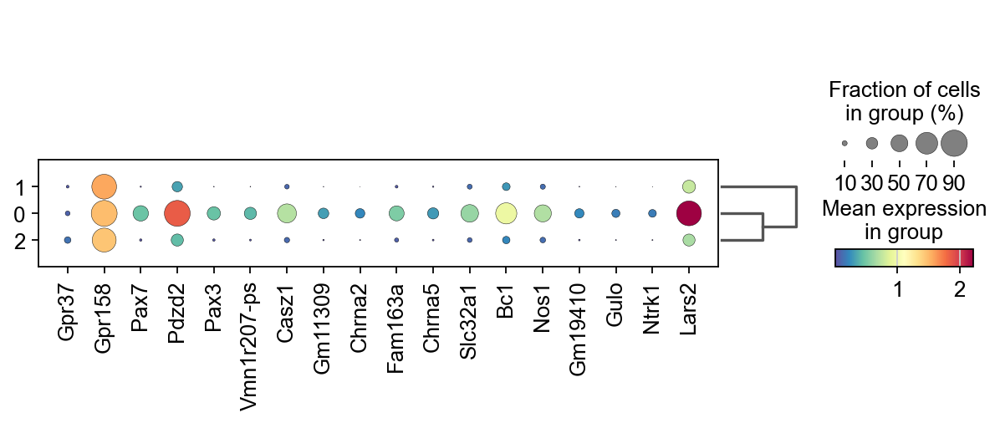

In [102]:
sc.pl.dotplot(adata, c0_gene,groupby=["leiden_res_0.10"],cmap='Spectral_r',dendrogram=True)

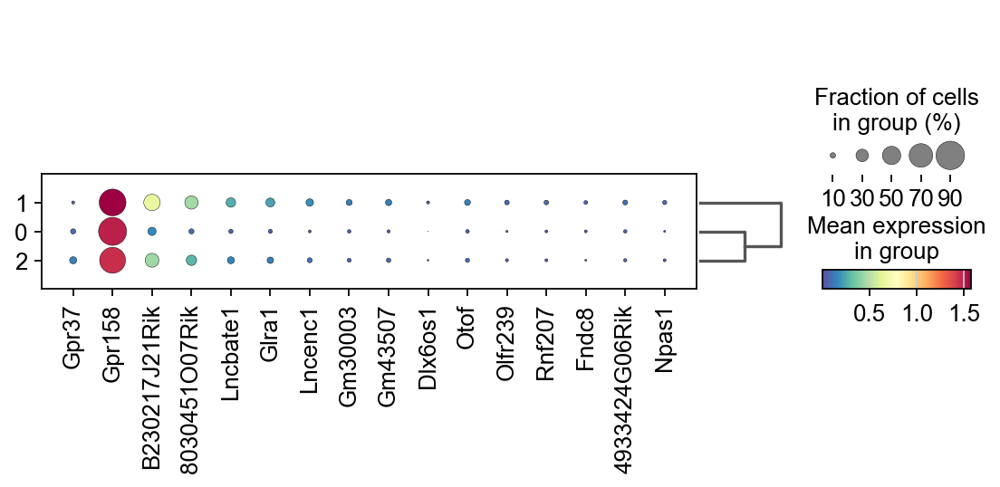

In [101]:
sc.pl.dotplot(adata, c1_gene,groupby=["leiden_res_0.10"],cmap='Spectral_r',dendrogram=True)

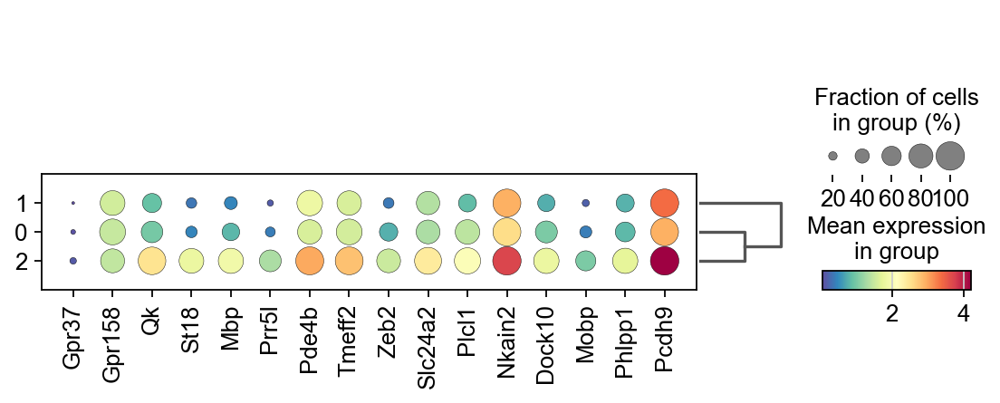

In [104]:
sc.pl.dotplot(adata, c2_gene,groupby=["leiden_res_0.10"],cmap='Spectral_r',dendrogram=True)

In [105]:
adata.write('VTA_GABA_Glut.h5ad')

In [83]:
c2 = adata[adata.obs['leiden_res_0.10'] == '2',:]

In [91]:
c2

View of AnnData object with n_obs × n_vars = 1878 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.50', 'neighbors', 'pca', 'umap', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.40', 'leiden_res_0.10', 'leiden_res_0.15', 'leiden_res

In [85]:
del c2.obs['leiden_res_0.50']
del c2.obs['leiden_res_0.80']
del c2.obs['leiden_res_0.20']
del c2.obs['leiden_res_0.30']
del c2.obs['leiden_res_0.40']
del c2.obs['leiden_res_0.10']
del c2.obs['leiden_res_0.15']
del c2.obs['leiden_res_0.05']
del c2.obs['leiden_res_0.07']
del c2.obs['leiden_res_1.00']
del c2.obs['leiden_res_1.20']
del c2.obs['leiden_res_1.50']

In [90]:
del c2.uns['dendrogram_leiden_res_0.50']
del c2.uns['dendrogram_leiden_res_0.80']
del c2.uns['dendrogram_leiden_res_1.00']
del c2.uns['dendrogram_leiden_res_1.20']
del c2.uns['dendrogram_leiden_res_1.50']


In [88]:
del c2.uns['leiden_res_0.50']
del c2.uns['leiden_res_0.80']
del c2.uns['leiden_res_0.20']
del c2.uns['leiden_res_0.30']
del c2.uns['leiden_res_0.40']
del c2.uns['leiden_res_0.10']
del c2.uns['leiden_res_0.15']
del c2.uns['leiden_res_0.05']
del c2.uns['leiden_res_0.07']
del c2.uns['leiden_res_1.00']
del c2.uns['leiden_res_1.20']
del c2.uns['leiden_res_1.50']

In [92]:
c2

View of AnnData object with n_obs × n_vars = 1878 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.50', 'neighbors', 'pca', 'umap', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.40', 'leiden_res_0.10', 'leiden_res_0.15', 'leiden_res

In [93]:
c2.write('VTA_GABA_Glut_Cluster2.h5ad')

In [106]:
adata

AnnData object with n_obs × n_vars = 5736 × 22948
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'predicted_doublet', 'Sample', 'Class', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00', 'leiden_res_1.20', 'leiden_res_1.50', 'leiden_res_0.20', 'leiden_res_0.30', 'leiden_res_0.40', 'leiden_res_0.10', 'leiden_res_0.15', 'leiden_res_0.05', 'leiden_res_0.07'
    var: 'gene_ids', 'feature_types', 'n_cells-VTA_1', 'highly_variable-VTA_1', 'means-VTA_1', 'dispersions-VTA_1', 'dispersions_norm-VTA_1', 'n_cells-VTA_2', 'highly_variable-VTA_2', 'means-VTA_2', 'dispersions-VTA_2', 'dispersions_norm-VTA_2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Neuron_colors', 'Neuron_merge_colors', 'Sample_colors', 'dendrogram_leiden_res_0.50', 'dendrogram_leiden_res_0.80', 'dendrogram_leiden_res_1.00', 'dendrogram_leiden_res_1.20', 'dendrogram_leiden_res_1.50', 'hvg', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.80', 'leiden_res_0.80_colors

In [107]:
adata.obsm['X_umap']

array([[ 5.6438227 ,  1.209892  ],
       [-3.0766141 ,  3.1324344 ],
       [ 4.1014533 ,  5.342516  ],
       ...,
       [-0.22124326,  0.24990559],
       [ 3.053533  ,  0.47290808],
       [ 6.0366073 ,  6.7797937 ]], dtype=float32)

In [108]:
adata.obsm['X_umap'].shape

(5736, 2)

In [113]:
umap = pd.DataFrame(adata.obsm['X_umap'],index = adata.obs.index,columns=['UMAP 1','UMAP 2'])

In [114]:
umap

,UMAP 1,UMAP 2
AAACCCAAGACTGTTC-1-VTA_1,5.643823,1.209892
AAACCCAGTCACTAGT-1-VTA_1,-3.076614,3.132434
AAACGAAAGGTCATTC-1-VTA_1,4.101453,5.342516
AAACGCTAGAATCGTA-1-VTA_1,-3.821341,0.905178
AAACGCTTCACGATAC-1-VTA_1,4.490354,0.846026
...,...,...
TTTGGTTTCCTGTACC-1-VTA_2,5.747192,8.344614
TTTGTTGAGATGATTG-1-VTA_2,6.848190,6.824908
TTTGTTGGTGGGACAT-1-VTA_2,-0.221243,0.249906
TTTGTTGGTTACCTGA-1-VTA_2,3.053533,0.472908


In [119]:
import anndata 
from scipy.stats import zscore
from scipy import sparse 
import itertools
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.decomposition import PCA
from umap import UMAP
from py_pcha import PCHA
from matplotlib.colors import LinearSegmentedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances_argmin

In [120]:
zlognorm_allgene = zscore(np.array(adata.X.todense()), axis=0)
adata.layers['zscore'] = zlognorm_allgene
scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(zlognorm_allgene)
scale_zlognorm_allgene = scaler.transform(zlognorm_allgene)
adata.layers['zscore_scale'] = scale_zlognorm_allgene

/opt/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:473: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/opt/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_data.py:474: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)


In [117]:
ge = pd.DataFrame(adata.X.todense(), index= adata.obs.index,columns = adata.var.index )

In [118]:
ge

,Xkr4,Gm1992,Gm19938,Rp1,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Gm16041,...,AC168977.1,CAAA01118383.1,AC132444.6,Vamp7,Spry3,Tmlhe,4933409K07Rik,Gm10931,CAAA01147332.1,AC149090.1
AAACCCAAGACTGTTC-1-VTA_1,1.740722,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.983565
AAACCCAGTCACTAGT-1-VTA_1,1.695867,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.748034,0.748034,0.0,...,0.0,0.748034,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,2.583338
AAACGAAAGGTCATTC-1-VTA_1,1.149141,0.000000,0.000000,0.0,0.0,0.541448,0.00000,0.890763,0.541448,0.0,...,0.0,0.890763,0.0,0.0,0.0,0.890763,0.0,0.0,0.0,1.524418
AAACGCTAGAATCGTA-1-VTA_1,2.399195,1.350986,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.888144,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.350986
AAACGCTTCACGATAC-1-VTA_1,2.778645,0.000000,0.000000,0.0,0.0,0.000000,0.00000,1.060269,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCTGTACC-1-VTA_2,2.364242,0.000000,0.000000,0.0,0.0,0.727869,0.00000,0.727869,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
TTTGTTGAGATGATTG-1-VTA_2,2.159381,0.823135,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.823135,0.0,0.0,0.0,0.823135
TTTGTTGGTGGGACAT-1-VTA_2,1.317209,1.317209,0.000000,0.0,0.0,0.000000,0.00000,0.000000,1.317209,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000
TTTGTTGGTTACCTGA-1-VTA_2,1.551566,0.000000,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,2.132711


In [121]:
ge_zscore = pd.DataFrame(adata.layers['zscore_scale'], index= adata.obs.index,columns = adata.var.index )

In [122]:
umap['Gpr37'] = list(ge['Gpr37'])
umap['Gpr158'] = list(ge['Gpr158'])

In [124]:
import seaborn as sns

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


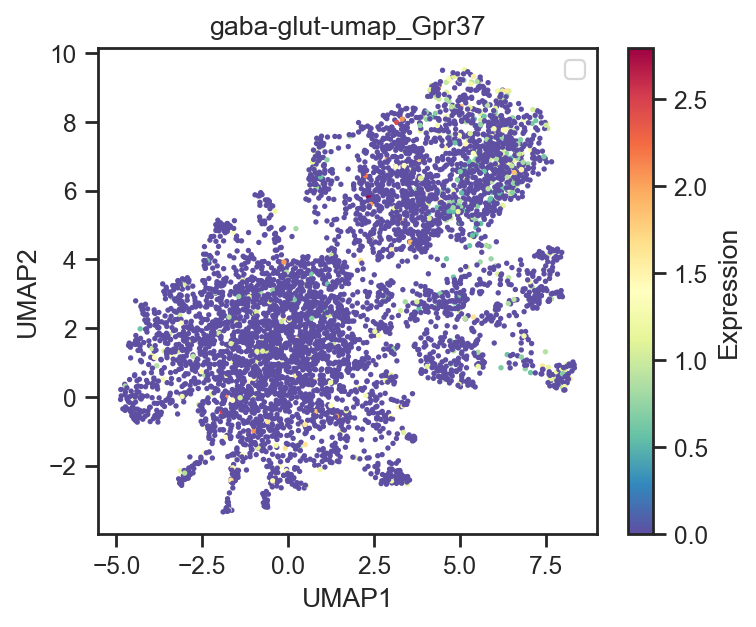

In [129]:
sns.set_theme(style="ticks")
fig, ax = plt.subplots(figsize=(5,4))
x = list(umap['UMAP 1'])
y = list(umap['UMAP 2'])
hue = list(umap['Gpr37'])
plt.scatter(x,y,c=hue,cmap = 'Spectral_r',s=2)
plt.legend()
plt.colorbar(label='Expression')
plt.title('gaba-glut-umap_Gpr37')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

In [130]:
umap['Gpr37_zscore'] = list(ge_zscore['Gpr37'])
umap['Gpr158_zscore'] = list(ge_zscore['Gpr158'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


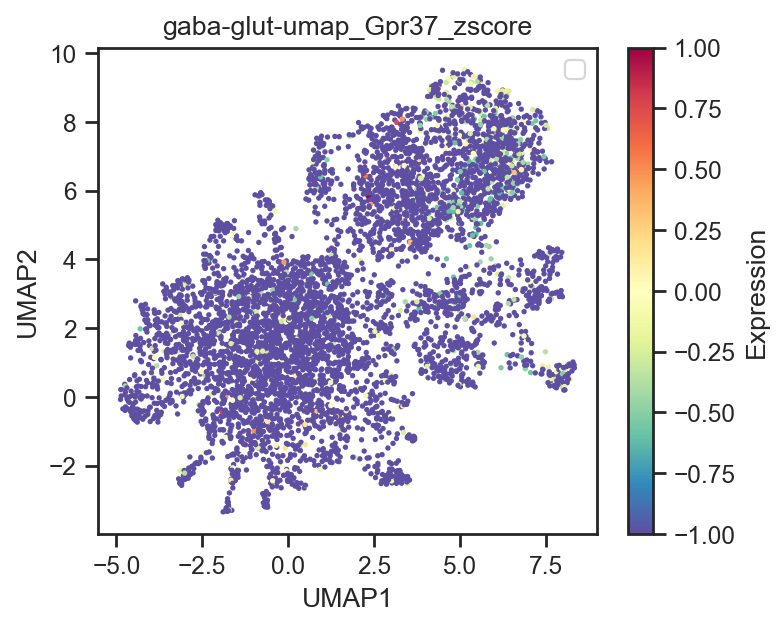

In [132]:
sns.set_theme(style="ticks")
fig, ax = plt.subplots(figsize=(5,4))
x = list(umap['UMAP 1'])
y = list(umap['UMAP 2'])
hue = list(umap['Gpr37_zscore'])
plt.scatter(x,y,c=hue,cmap = 'Spectral_r',s=2)
plt.legend()
plt.colorbar(label='Expression')
plt.title('gaba-glut-umap_Gpr37_zscore')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

In [133]:
umap['Kcnk13'] = list(ge_zscore['Kcnk13'])
umap['Kcnj3'] = list(ge_zscore['Kcnj3'])
umap['Kcnd2'] = list(ge_zscore['Kcnd2'])
umap['Kcnn1'] = list(ge_zscore['Kcna1'])
umap['Kcnd3'] = list(ge_zscore['Kcnd3'])
umap['Kcnn2'] = list(ge_zscore['Kcna2'])

In [134]:
umap.to_csv('gaba-glut-umap.xls',index=True,sep='\t')

In [135]:
umap_bin=pd.read_csv('gaba-glut-umap_output.xls',sep='\t')

In [136]:
umap_bin

,Bin_1,Bin2,Gpr37,Gpr158,Gpr37_zscore,Gpr158_zscore,Kcnk13,Kcnj3,Kcnd2,Kcnn1,Kcnd3,Kcnn2,Unnamed: 12
0,-5,-1,0.023570,2.012698,-0.983138,-0.080498,-0.919317,-0.673111,-0.229451,-0.983611,-0.567717,-0.866791,NaN
1,-5,0,0.026164,1.859807,-0.981282,-0.150347,-0.931612,-0.411394,0.001178,-0.944120,-0.579760,-0.884808,NaN
2,-5,1,0.020581,1.443575,-0.985276,-0.340502,-0.919099,-0.414403,-0.024401,-0.943319,-0.589839,-0.840160,NaN
3,-5,2,0.000000,1.874948,-1.000000,-0.143429,-0.943079,-0.211916,-0.078262,-0.959134,-0.329286,-0.900562,NaN
4,-4,-3,0.141552,1.300958,-0.898733,-0.405657,-1.000000,-0.718501,0.399727,-1.000000,-0.547678,-0.873018,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,7,6,0.082915,1.653238,-0.940682,-0.244718,-0.793400,-0.535266,-0.135876,-0.748800,-0.663889,-0.796592,NaN
120,7,7,0.233067,1.413344,-0.833263,-0.354313,-0.871298,-0.297278,-0.150460,-0.680347,-0.581446,-0.865612,NaN
121,7,8,0.235756,0.933397,-0.831339,-0.573577,-0.900430,-0.607641,-0.023169,-0.723312,-0.546192,-0.874816,NaN
122,8,0,0.236890,1.088405,-0.830527,-0.502762,-0.610265,-0.571246,0.105563,-0.502998,-0.667200,-0.842696,NaN


In [137]:
from scipy.stats import pearsonr, spearmanr
from sklearn.linear_model import LinearRegression

Pearson correlation coefficient: 0.19269844837703293, p-value: 0.032016407976266405
Spearman correlation coefficient: 0.07429437339800447, p-value: 0.4121804432577204


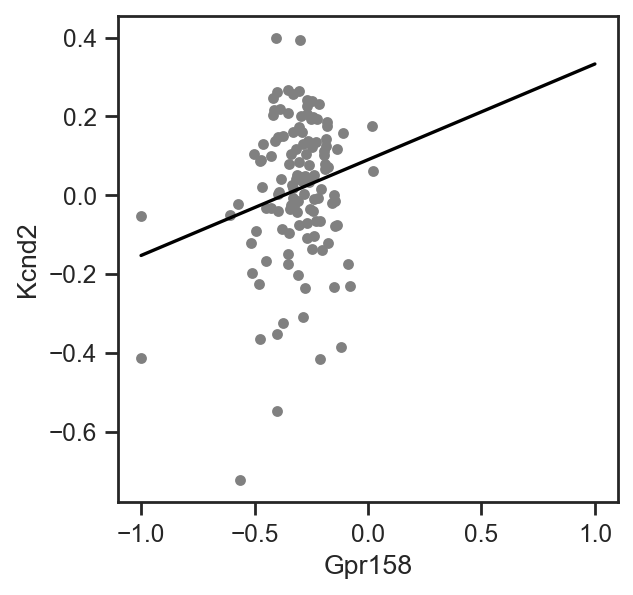

In [138]:
x = np.array(umap_bin['Gpr158_zscore'])
y = np.array(umap_bin['Kcnd2'])
# 线性拟合
model = LinearRegression()
model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
x_fit = np.linspace(-1, 1, 50)
y_fit = model.predict(x_fit.reshape(-1, 1))
# 绘制拟合曲线
plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Kcnd2')
ax.set_xlabel('Gpr158')
plt.savefig('Gpr158_Kcnd2_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

Pearson correlation coefficient: 0.44048020809091903, p-value: 3.062817317943239e-07
Spearman correlation coefficient: 0.2909857670037695, p-value: 0.0010428166229718033


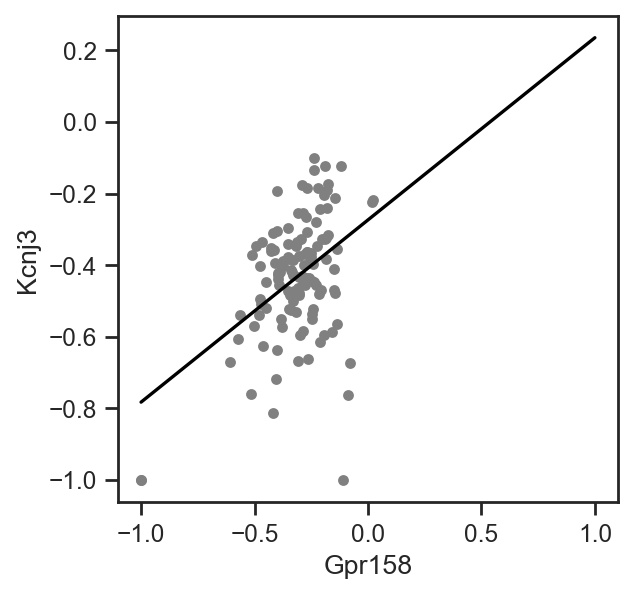

In [139]:
x = np.array(umap_bin['Gpr158_zscore'])
y = np.array(umap_bin['Kcnj3'])
# 线性拟合
model = LinearRegression()
model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
x_fit = np.linspace(-1, 1, 50)
y_fit = model.predict(x_fit.reshape(-1, 1))
# 绘制拟合曲线
plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Kcnj3')
ax.set_xlabel('Gpr158')
plt.savefig('Gpr158_Kcnj3_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

Pearson correlation coefficient: 0.43035069862493397, p-value: 6.079271807803773e-07
Spearman correlation coefficient: 0.3239467469739293, p-value: 0.0002422961064153183


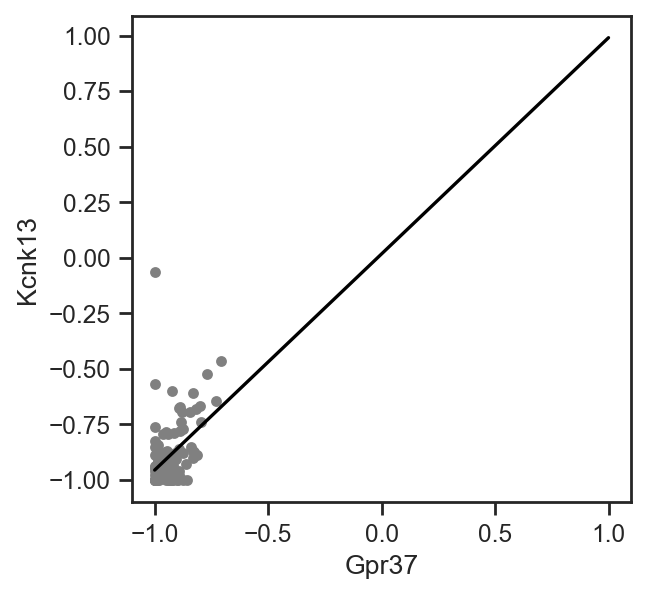

In [140]:
x = np.array(umap_bin['Gpr37_zscore'])
y = np.array(umap_bin['Kcnk13'])
# 线性拟合
model = LinearRegression()
model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
x_fit = np.linspace(-1, 1, 50)
y_fit = model.predict(x_fit.reshape(-1, 1))
# 绘制拟合曲线
plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Kcnk13')
ax.set_xlabel('Gpr37')
plt.savefig('Gpr37_Kcnk13_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

Pearson correlation coefficient: 0.43035069862493397, p-value: 6.079271807803773e-07
Spearman correlation coefficient: 0.3239467469739293, p-value: 0.0002422961064153183


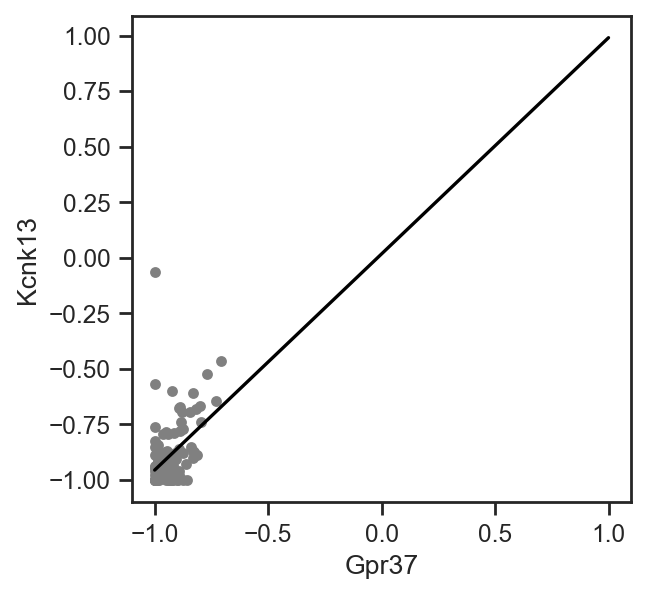

In [148]:
x = np.array(umap_bin['Gpr37_zscore'])
y = np.array(umap_bin['Kcnk13'])
# 线性拟合
model = LinearRegression()
model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
x_fit = np.linspace(-1, 1, 50)
y_fit = model.predict(x_fit.reshape(-1, 1))
# 绘制拟合曲线
plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Kcnk13')
ax.set_xlabel('Gpr37')
#plt.savefig('Gpr37_Kcnk13_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

Pearson correlation coefficient: -0.1713613884974993, p-value: 0.057043789259578995
Spearman correlation coefficient: -0.2295234003114164, p-value: 0.010338136048944726


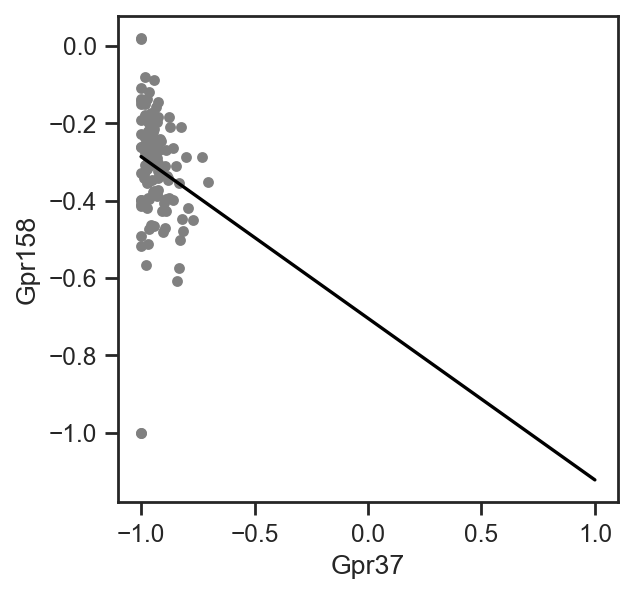

In [146]:
x = np.array(umap_bin['Gpr37_zscore'])
y = np.array(umap_bin['Gpr158_zscore'])
# 线性拟合
model = LinearRegression()
model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
x_fit = np.linspace(-1, 1, 50)
y_fit = model.predict(x_fit.reshape(-1, 1))
# 绘制拟合曲线
plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Gpr158')
ax.set_xlabel('Gpr37')
plt.savefig('Gpr37_Gpr158_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

Pearson correlation coefficient: -0.1713613884974993, p-value: 0.057043789259578995
Spearman correlation coefficient: -0.2295234003114164, p-value: 0.010338136048944726


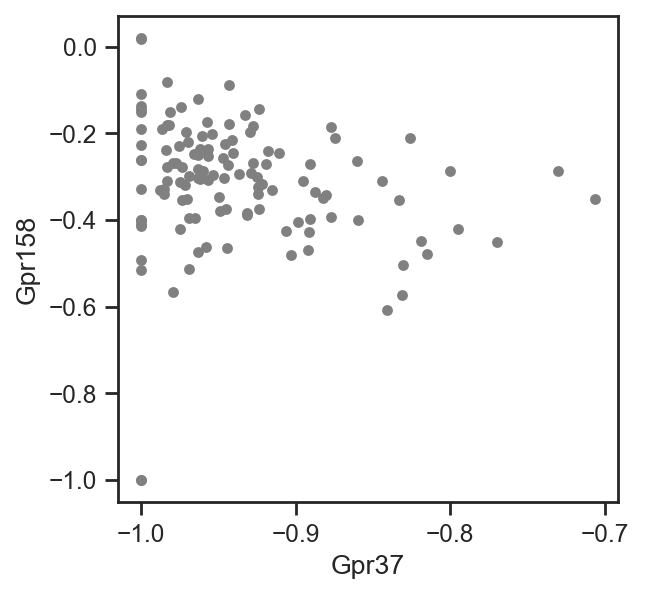

In [154]:
x = np.array(umap_bin['Gpr37_zscore'])
y = np.array(umap_bin['Gpr158_zscore'])
# 线性拟合
#model = LinearRegression()
#model.fit(x.reshape(-1, 1), y)
 
fig = plt.figure(figsize=plt.figaspect(6/6)) 
ax = fig.add_subplot()
# 绘制原始数据点
ax.scatter(x, y,color = 'grey',s = 15)
 
# 计算拟合线的x值
#x_fit = np.linspace(-1, 0, 50)
#y_fit = model.predict(x_fit.reshape(-1, 0))
# 绘制拟合曲线
#plt.plot(x_fit, y_fit, color='black')
ax.set_ylabel('Gpr158')
ax.set_xlabel('Gpr37')
#plt.savefig('Gpr37_Gpr158_gaba-glut_umap_corr.tif')
# Pearson相关系数
pearson_coef, pearson_p = pearsonr(x, y)
# Spearman相关系数
spearman_coef, spearman_p = spearmanr(x, y)
 
# 打印结果
print(f"Pearson correlation coefficient: {pearson_coef}, p-value: {pearson_p}")
print(f"Spearman correlation coefficient: {spearman_coef}, p-value: {spearman_p}")

In [163]:
sns.set_theme(style="ticks")

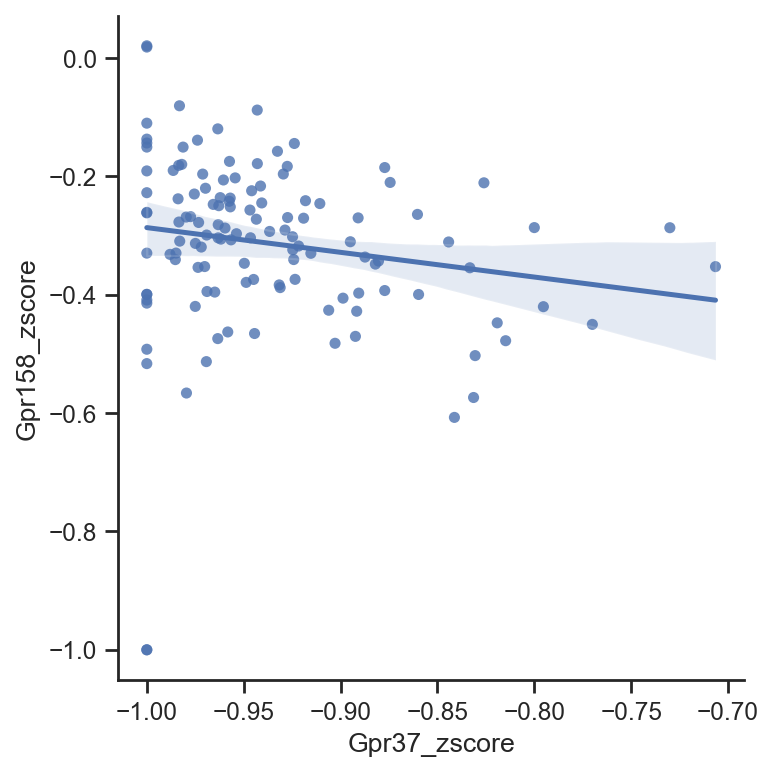

In [169]:
sns.set_theme(style="ticks")
sns.lmplot(data=umap_bin, x="Gpr37_zscore", y="Gpr158_zscore", scatter_kws=dict(s=25,edgecolor='none'))

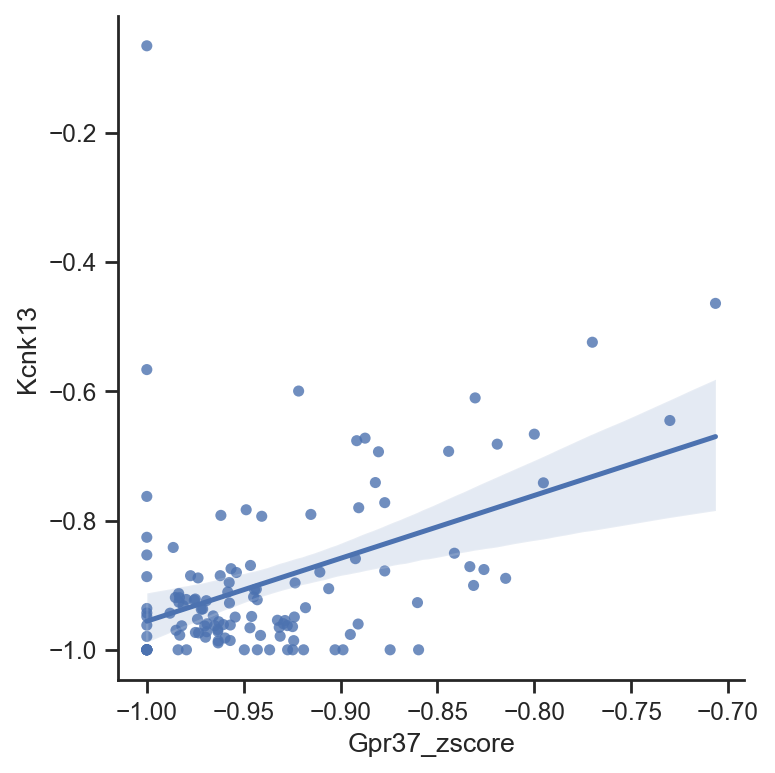

In [170]:
sns.lmplot(data=umap_bin, x="Gpr37_zscore", y="Kcnk13", scatter_kws=dict(s=25,edgecolor='none'))

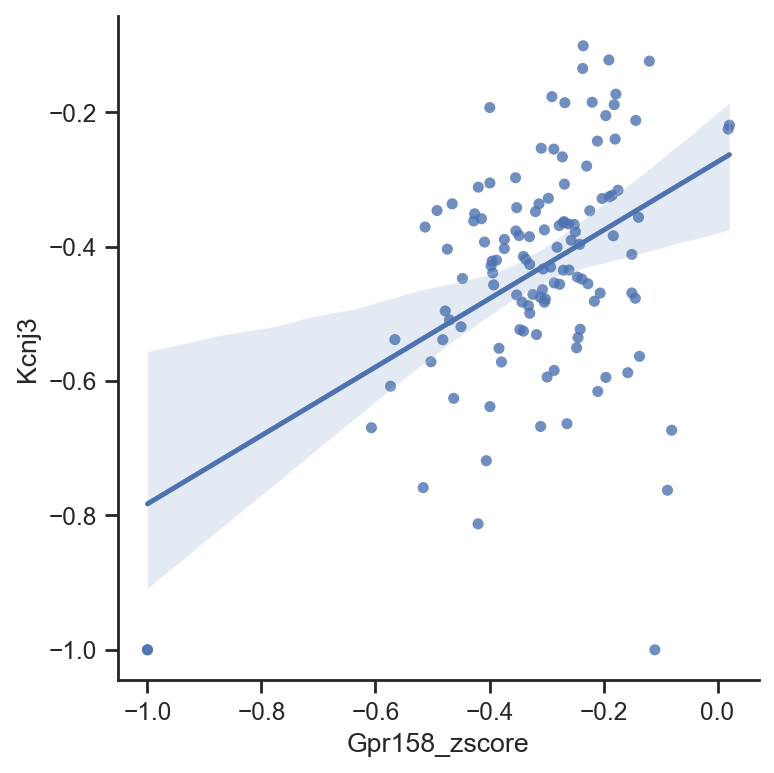

In [172]:
sns.lmplot(data=umap_bin, x="Gpr158_zscore", y="Kcnj3", scatter_kws=dict(s=25,edgecolor='none'))

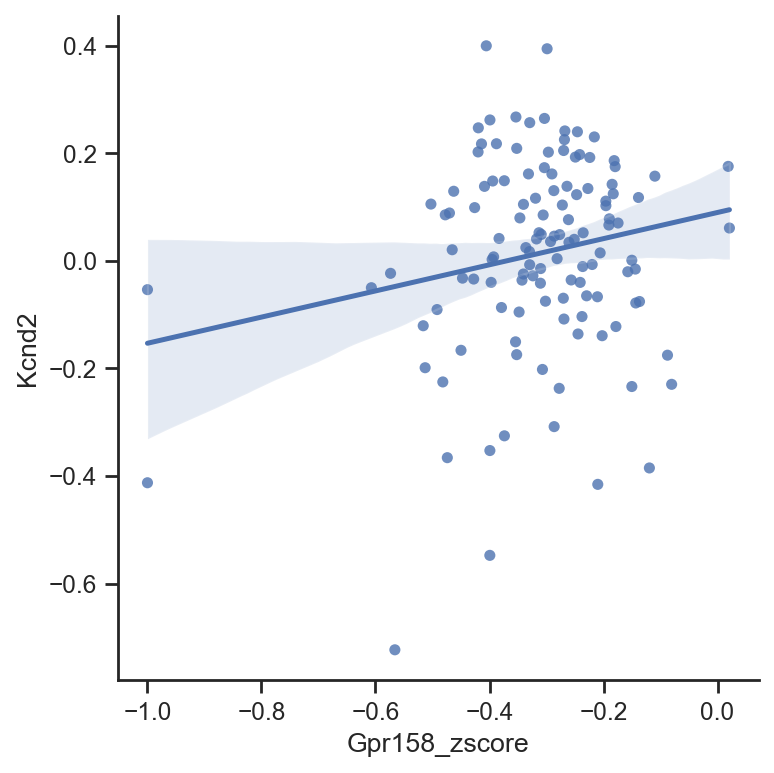

In [173]:
sns.lmplot(data=umap_bin, x="Gpr158_zscore", y="Kcnd2", scatter_kws=dict(s=25,edgecolor='none'))